<a href="https://colab.research.google.com/github/mmdreza-ghorbani/Thesis_codes/blob/main/Route%20Finding%20in%20Tehran%20using%20weights.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Import modules

In [ ]:
!pip install geopandas
!pip install rasterio
!pip install osmnx



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 41.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.4/101.4 kB 2.0 MB/s eta 0:00:00


In [ ]:

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio
import rasterio.mask
from rasterio.plot import show
from rasterio.transform import Affine
from scipy.spatial import Voronoi, voronoi_plot_2d
from shapely.geometry import box
from shapely.geometry import Polygon, Point
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
import numpy as np
from osgeo import gdal
import geopandas as gpd

In [ ]:
TifExportUrl = '/content/drive/My Drive/Tif_Export/'
ShapefilesURL='/content/drive/My Drive/ShapeFiles/'
mainURL = '/content/drive/My Drive/'
AirPolutionURL='/content/drive/My Drive/AIRNOW/'
AsthemaricURL = '/content/drive/My Drive/AsthematicData/'





get access from user

In [ ]:
from google.colab import drive
drive.mount('/content/drive')



Mounted at /content/drive


## read network

In [ ]:
import osmnx as ox

# Define the polygon for the area of interest (e.g., city, neighborhood)
TehranPolygon = ox.geocode_to_gdf({'city':'Tehran'})
TehranPolygon = TehranPolygon.geometry.iloc[0]  # Extract the polygon geometry

# Download the street network within the polygon
G = ox.graph_from_polygon(TehranPolygon, network_type='all')  # Adjust network_type as needed


In [ ]:

# Plot the network
#fig, ax = ox.plot_graph(G)


 u and v describe the topological relationship within the network: they denote the start and end node of each edge.

In [ ]:
# Transform the graph to UTM
graph = ox.project_graph(G)

# Extract reprojected nodes and edges
nodes, edges = ox.graph_to_gdfs(graph)

nodes.crs

<Projected CRS: +proj=utm +zone=39 +ellps=WGS84 +datum=WGS84 +unit ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: UTM zone 39N
- method: Transverse Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
nodes.head()

,y,x,street_count,lon,lat,highway,ref,geometry
osmid,,,,,,,,
25920665,3.950767e+06,532133.016823,3,51.355188,35.700304,NaN,NaN,POINT (532133.017 3950766.783)
1921578857,3.950766e+06,532108.990099,3,51.354923,35.700300,NaN,NaN,POINT (532108.990 3950766.264)
712663582,3.950860e+06,532121.136925,4,51.355061,35.701143,NaN,NaN,POINT (532121.137 3950859.706)
25920706,3.952319e+06,533301.675099,4,51.368170,35.714262,NaN,NaN,POINT (533301.675 3952319.201)
1656064200,3.952190e+06,533405.433289,3,51.369312,35.713091,NaN,NaN,POINT (533405.433 3952189.658)


In [ ]:
edges.head()

osmid  oneway               name    highway  \
u          v          key                                                    
25920665   1921578857 0    884218508    True      کنارگذر آزادی  secondary   
           712663582  0      4316294    True  محمدعلی حبیب الله  secondary   
1921578857 25922488   0    884218508    True      کنارگذر آزادی  secondary   
712663582  864664999  0     72859064   False              یاران    service   
           2131766629 0    444587353   False                NaN  secondary   

                          maxspeed reversed  length  ref  \
u          v          key                                  
25920665   1921578857 0         50    False  23.987  NaN   
           712663582  0         50    False  96.951  307   
1921578857 25922488   0         50    False  27.221  NaN   
712663582  864664999  0         30    False  41.937  NaN   
           2131766629 0        NaN     True   8.817  NaN   

                                                                    geometry  \
u          v          key                                                      
25920665   1921578857 0    LINESTRING (532133.017 3950766.783, 532108.990...   
           712663582  0    LINESTRING (532133.017 3950766.783, 532124.296...   
1921578857 25922488   0    LINESTRING (532108.990 3950766.264, 532081.725...   
712663582  864664999  0    LINESTRING (532121.137 3950859.706, 532157.985...   
           2131766629 0    LINESTRING (532121.137 3950859.706, 532112.411...   

                          service lanes access bridge junction width tunnel  \
u          v          key                                                     
25920665   1921578857 0       NaN   NaN    NaN    NaN      NaN   NaN    NaN   
           712663582  0       NaN   NaN    NaN    NaN      NaN   NaN    NaN   
1921578857 25922488   0       NaN   NaN    NaN    NaN      NaN   NaN    NaN   
712663582  864664999  0     alley   NaN    NaN    NaN      NaN   NaN    NaN   
           2131766629 0       NaN   NaN    NaN    NaN      NaN   NaN    NaN   

                          landuse  
u          v          key          
25920665   1921578857 0       NaN  
           712663582  0       NaN  
1921578857 25922488   0       NaN  
712663582  864664999  0       NaN  
           2131766629 0       NaN

## get raster for weight to network

In [ ]:
import rasterio
TifExportUrl = '/content/drive/My Drive/Tif_Export/'
raster_pk = rasterio.open( TifExportUrl + 'CNN_prediction.tif')


## weight is cost in here

In [ ]:
listOfwight = []
listofsource = []
listoftarget = []
listofweight = []
roads = edges
# weight is cost in here
for idx, road in roads.iterrows():
    # Get the road segment attributes
    source = idx[0] #['u']
    target = idx[1] #['v']
   # length = road['length']
   # speed = edges['maxspeed']

    # Calculate the average air pollution along the road segment
    rasterValue = next(raster_pk.sample([(road['geometry'].centroid.x, road['geometry'].centroid.y)]))[0]
   # avg_rasterValuen = rasterValue_values.mean()

    # Calculate the average slope along the road segment
  #  slope_values = slope.sample([(road['geometry'].centroid.x, road['geometry'].centroid.y)])
  #  avg_slope = slope_values.mean()
    weight = rasterValue #length +
    if(source == np.nan or target == np.nan or weight == np.nan):
      continue;
    # Calculate the weight based on length, air pollution, and slope
    listOfwight.append((source, target, round(weight, 2)))
    listofsource.append(source)
    listoftarget.append(target)
    listofweight.append( round(weight, 2))
    # Add the road segment to the network graph with the weight
    #G.add_edge(source, target, weight=weight)

In [ ]:
import networkx as nx
nx.is_weighted(graph)

False

In [ ]:
import pandas as pd
tempPath = '/content/drive/My Drive/tempFile/'
dfOfwight = pd.DataFrame({'weight':listofweight})
dfOfwight['source'] = listofsource
dfOfwight['target'] = listoftarget
dfOfwight.to_csv(tempPath + 'newlength and AsthmaValue' + '.csv')
df = pd.DataFrame({'values':listOfwight})
df.to_csv(tempPath + 'length and AsthmaValue' + '.csv')

## get address

In [ ]:
origin = (
    ox.geocode_to_gdf("Amir Abad, ناحیه ۴, District 6, شهرداری منطقه شش ناحیه یک, Tehran, بخش مرکزی شهرستان تهران, Tehran County, 14399-55471, Iran")  # fetch geolocation
    .to_crs(edges.crs)  # transform to UTM
    .at[0, "geometry"]  # pick geometry of first row
    .centroid  # use the centre point
)

destination = (
    ox.geocode_to_gdf("Tehran County, Tehran Province, 14118-53161, Iran")
    .to_crs(edges.crs)
    .at[0, "geometry"]
    .centroid
)

get nearest node id

In [ ]:
origin_node_id = ox.nearest_nodes(graph, origin.x, origin.y)
origin_node_id

In [ ]:
destination_node_id = ox.nearest_nodes(graph, destination.x, destination.y)
destination_node_id

## routing

In [ ]:
route = ox.shortest_path(graph, origin_node_id, destination_node_id)
route

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[7178799569,
 424074880,
 424074869,
 424074867,
 424074864,
 424074862,
 424074857,
 424074855,
 424074922,
 424074839,
 424074830,
 7072016317,
 7072016318,
 7072016319,
 7073930014,
 7072016320,
 7072016323,
 1649357090,
 7072016321,
 1649357095,
 1649357092,
 1649357097,
 10573211090,
 7072016339,
 7072016340,
 26366034,
 7072016335,
 7072016334,
 1649357154,
 27585289,
 1649357184,
 7072016328,
 7072016331,
 4754977026,
 4391394137,
 768559213,
 3953155573,
 4532784220,
 4532784206,
 806589528,
 4467482799,
 4433262166,
 4433262172,
 423811142,
 4297872626,
 2169893048,
 2169893046,
 4297872625,
 9672260176,
 9672264424,
 9672260190,
 9672260173,
 6913008377,
 6547553681,
 9672264437,
 9672264430,
 9672264433,
 9672264435,
 9672264432,
 6547556116,
 9887792214,
 9887792213,
 362831599,
 1653424517,
 1653424564,
 1653424548]

plot

save

In [ ]:
# Get the nodes along the shortest path
route_nodes = nodes.loc[route]
route_nodes

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,y,x,street_count,lon,lat,highway,ref,geometry
osmid,,,,,,,,
7178799569,3.954504e+06,535360.584088,3,51.391029,35.733893,NaN,NaN,POINT (535360.584 3954504.401)
424074880,3.954530e+06,535346.716866,3,51.390876,35.734128,NaN,NaN,POINT (535346.717 3954530.388)
424074869,3.954587e+06,535332.409271,4,51.390721,35.734643,NaN,NaN,POINT (535332.409 3954587.495)
424074867,3.954620e+06,535333.156164,2,51.390730,35.734938,NaN,NaN,POINT (535333.156 3954620.206)
424074864,3.954661e+06,535340.898732,4,51.390818,35.735302,NaN,NaN,POINT (535340.899 3954660.631)
...,...,...,...,...,...,...,...,...
9887792213,3.956635e+06,534421.611862,3,51.380737,35.753133,NaN,NaN,POINT (534421.612 3956634.717)
362831599,3.956593e+06,534243.747659,3,51.378768,35.752763,NaN,NaN,POINT (534243.748 3956592.913)
1653424517,3.956582e+06,534065.627002,3,51.376797,35.752672,NaN,NaN,POINT (534065.627 3956582.134)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


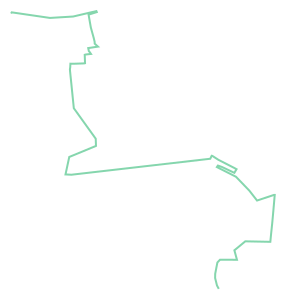

In [ ]:
import shapely.geometry

# Create a geometry for the shortest path
route_line = shapely.geometry.LineString(
    list(route_nodes.geometry.values)
)
route_line

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


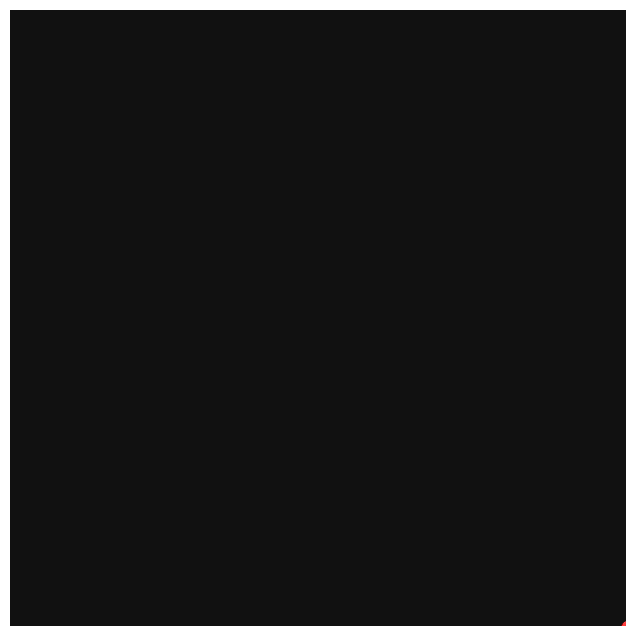

In [ ]:
# Plot the shortest path
fig, ax = ox.plot_graph_route(graph, route ,route_color='r', route_linewidth=4, route_alpha=0.5, orig_dest_size=1000, ax=None,bbox = route_line.buffer(10000).bounds)

In [ ]:
import geopandas

route_geom = geopandas.GeoDataFrame(
    {
        "geometry": [route_line],
        "osm_nodes": [route],
    },
    crs=edges.crs
)

# Calculate the route length
route_geom["length_m"] = route_geom.length

route_geom.head()

,geometry,osm_nodes,length_m
0,"LINESTRING (535360.584 3954504.401, 535346.717...","[7178799569, 424074880, 424074869, 424074867, ...",5610.199262


plot with buliding on map

In [ ]:
buildings = ox.geometries_from_place(
    'Tehran',
    {
        "building" : True
    }
).to_crs(edges.crs)

In [ ]:
import contextily
import matplotlib.pyplot

fig, ax = matplotlib.pyplot.subplots(figsize=(12,8))

# Plot edges and nodes
edges.plot(ax=ax, linewidth=0.75, color='gray')
nodes.plot(ax=ax, markersize=2, color='gray')

# Add buildings
ax = buildings.plot(ax=ax, facecolor='lightgray', alpha=0.7)

# Add the route
ax = route_geom.plot(ax=ax, linewidth=2, linestyle='--', color='red')

# Add basemap
contextily.add_basemap(ax, crs=buildings.crs, source=contextily.providers.CartoDB.Positron)

## add weights to graph

In [ ]:
import pandas as pd
tempPath = '/content/drive/My Drive/tempFile/'
wightlist = pd.read_csv(tempPath + 'newlength and AsthmaValue' + '.csv', encoding='utf-8-sig')
wightlist.drop(wightlist[[ 'Unnamed: 0']], axis=1, inplace=True)
wightlist.dropna()
newlistofwights = [tuple(r) for r in wightlist[['source', 'target', 'weight' ]].to_numpy()]

In [ ]:
graph.add_weighted_edges_from(newlistofwights)
nodes, edges = ox.graph_to_gdfs(graph)

## routing

In [ ]:
import networkx as nx
nx.is_weighted(graph)

False

In [ ]:
newRoute = ox.shortest_path(graph, origin_node_id, destination_node_id)
newRoute

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[7178799569,
 4591377575,
 1649357065,
 1649357063,
 1649357061,
 7730921967,
 7730931393,
 424074816,
 424074817,
 7730921964,
 7072015803,
 10653563673,
 25940101,
 25922580,
 8613135608,
 9216536674,
 1880160147,
 1649103779,
 1649104003,
 26364048,
 4754992132,
 26364031,
 26364029,
 7072016331,
 4754977026,
 26364264,
 5163833746,
 190980537,
 190980724,
 31207498,
 6465642865,
 6465743030,
 31073565,
 4755357125,
 1681485262,
 6588907494,
 7714218685,
 5507343483,
 270877066,
 9672264494,
 1653424691,
 1653424548]

plot

save

In [ ]:
# Get the nodes along the shortest path
newRoute_nodes = nodes.loc[newRoute]
newRoute_nodes

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,y,x,street_count,lon,lat,highway,ref,geometry
osmid,,,,,,,,
7178799569,3.954504e+06,535360.584088,3,51.391029,35.733893,NaN,NaN,POINT (535360.584 3954504.401)
4591377575,3.954428e+06,535381.135177,3,51.391253,35.733206,NaN,NaN,POINT (535381.135 3954428.309)
1649357065,3.954427e+06,535380.182802,3,51.391242,35.733192,NaN,NaN,POINT (535380.183 3954426.752)
1649357063,3.954415e+06,535381.729692,3,51.391258,35.733089,NaN,NaN,POINT (535381.730 3954415.290)
1649357061,3.954411e+06,535392.526547,3,51.391378,35.733049,NaN,NaN,POINT (535392.527 3954410.952)
7730921967,3.954290e+06,535480.114987,3,51.392341,35.731955,NaN,NaN,POINT (535480.115 3954289.964)
7730931393,3.954295e+06,535486.886002,4,51.392416,35.732001,NaN,NaN,POINT (535486.886 3954295.104)
424074816,3.954294e+06,535605.477790,4,51.393727,35.731983,NaN,NaN,POINT (535605.478 3954293.594)
424074817,3.954292e+06,535679.303995,4,51.394544,35.731969,NaN,NaN,POINT (535679.304 3954292.315)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


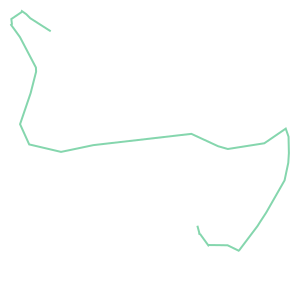

In [ ]:
import shapely.geometry

# Create a geometry for the shortest path
newRoute_line = shapely.geometry.LineString(
    list(newRoute_nodes.geometry.values)
)
newRoute_line

KeyError: ignored

Error in callback <function _draw_all_if_interactive at 0x7fc0e753d630> (for post_execute):


KeyboardInterrupt: ignored

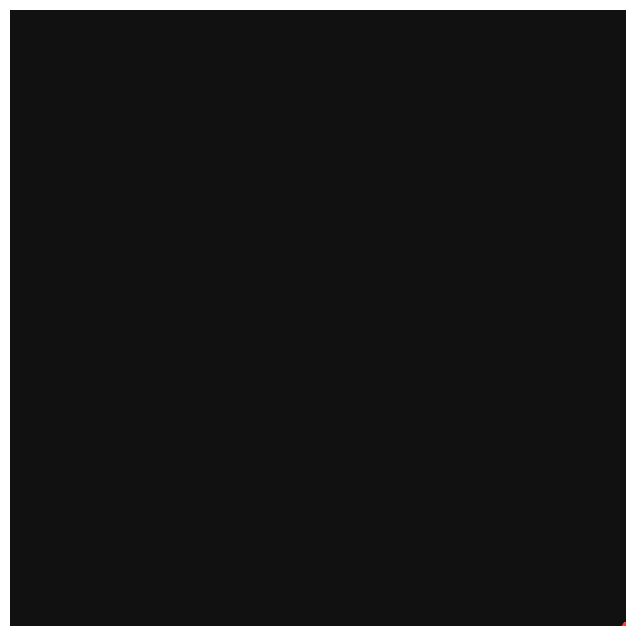

In [ ]:
# Plot the shortest path
fig, ax = ox.plot_graph_route(graph, newRoute ,route_color='r' ,bbox = newRoute_line.buffer(10000).bounds)

In [ ]:
import geopandas

newRoute_geom = geopandas.GeoDataFrame(
    {
        "geometry": [newRoute_line],
        "osm_nodes": [newRoute],
    },
    crs=edges.crs
)

# Calculate the route length
newRoute_geom["length_m"] = newRoute_geom.length

newRoute_geom.head()

,geometry,osm_nodes,length_m
0,"LINESTRING (535360.584 3954504.401, 535346.717...","[7178799569, 424074880, 424074869, 424074867, ...",5610.199262


## calculate ways base on raster layer

helper

In [ ]:
!pip install pyrosm
!pip install mapclassify


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 35.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 72.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 85.6 MB/s eta 0:00:00
  Using cached cykhash-2.0.1-cp310-cp310-linux_x86_64.whl
  Using cached pyrobuf-0.9.3-cp310-cp310-linux_x86_64.whl
  Created wheel for pyrosm: filename=pyrosm-0.6.1-cp310-cp310-linux_x86_64.whl size=7609244 sha256=fbd63c5f66334353470cf46c9a8d62220049fac28b805b41e7b01f3f18e8865c
  Stored in directory: /root/.cache/pip/wheels/01/44/59/55e667bfa74cabb609b947b7072ed3cdbaa528171efda10af6
Successfully built pyrosm


Find closest network node for each park:

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-17-409f67818dee>:7: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  parks = ox.geometries_from_place('Tehran', tags)


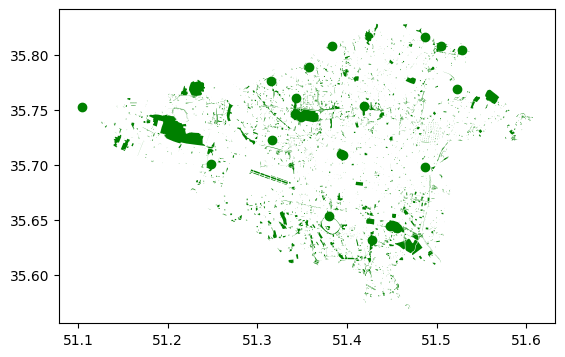

In [ ]:
ExportedJpegURL =  '/content/drive/My Drive/Exported_Jpeg/'

# Initialize the reader
# List key-value pairs for tags
tags = {'leisure': 'park', 'landuse': 'grass'}
# Get the data
parks = ox.geometries_from_place('Tehran', tags)
#proj = 'epsg:32639'
#parks = parks.to_crs(proj)
parks.plot(color="green");

#ox.geocode_to_gdf({'city':'Tehran', 'amenity': 'park'})
#osm = OSM(get_data("Tehran_pbf"))
#parks = osm.get_pois({"amenity": ["park"]})
#newParks = osm.get_parks()
#buildings = osm.get_buildings()

<ipython-input-16-aa4b787fd958>:3: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  buildings = ox.geometries_from_place('Tehran', tags)


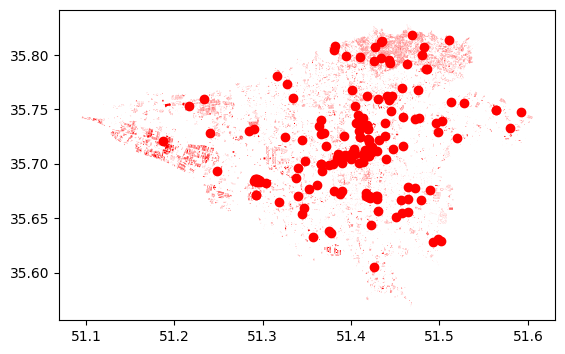

In [ ]:
# List key-value pairs for tags
tags = {'building': True}
buildings = ox.geometries_from_place('Tehran', tags)
#buildings = buildings.to_crs(proj)
buildings.plot(color="red");


if map change then you should get weights again and first row will have erro like "KeyError: 'x'"

In [ ]:
G_con = ox.project_graph(graph, to_crs='epsg:4326')
wgsnodes, wgsedges = ox.graph_to_gdfs(G_con)



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


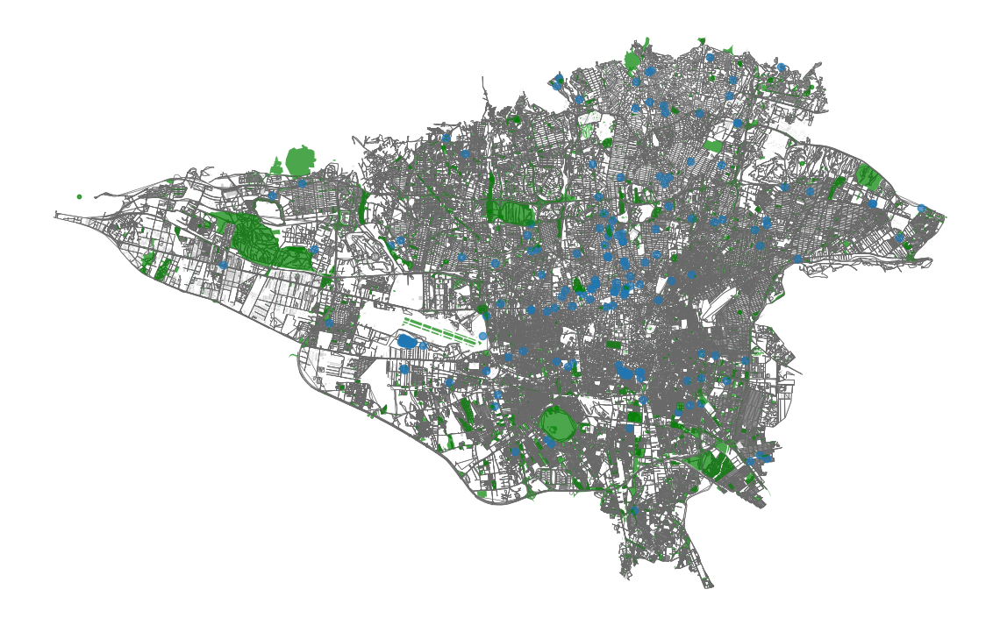

In [ ]:
ExportedJpegURL =  '/content/drive/My Drive/Exported_Jpeg/'

fig, ax = plt.subplots(figsize=(25,20))
# Plot the footprint
#area.plot(ax=ax, facecolor=’black’, zorder=0)
# Plot street edges
wgsedges.plot(ax=ax, linewidth=0.5, edgecolor='dimgray', zorder=1)
# Plot buildings
#buildings.plot(ax=ax, facecolor='silver', alpha=0.7, zorder=2)
# Plot parks
parks.plot(ax=ax, color='green', alpha=0.7, markersize=10, zorder=3)
plt.tight_layout()
plt.axis('off')
plt.savefig(ExportedJpegURL+ 'all_net_and_Park_and_buildings.jpg')


crop data based on BB

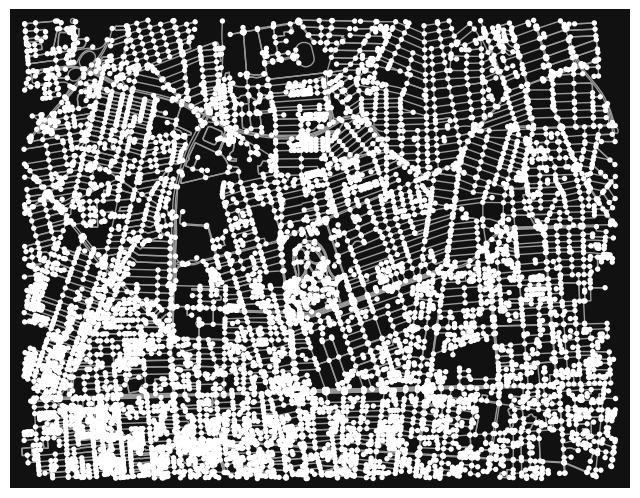

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [ ]:
#35.7333, 51.3619  #marzdaran metro station
#35.6934, 51.4253  # sa'adi metro station

# Define the bounding box coordinates
 #marzdaran metro station
north = 35.7333
west = 51.3619
 # sa'adi metro station
south = 35.6934
east = 51.4253

# Crop the graph to the bounding box
cropped_graph = ox.truncate.truncate_graph_bbox(G_con, north, south, east, west)

# Plot the cropped graph
ox.plot_graph(cropped_graph)

In [ ]:
# Create a bounding box as a GeoDataFrame
Cropbbox = gpd.GeoDataFrame(geometry=[box(west, south, east, north)], crs='EPSG:4326')

# Crop the GeoDataFrame based on the bounding box
parks = parks.cx[west:east, south:north]
buildings = buildings.cx[west:east, south:north]
wgsnodes, wgsedges = ox.graph_to_gdfs(cropped_graph)

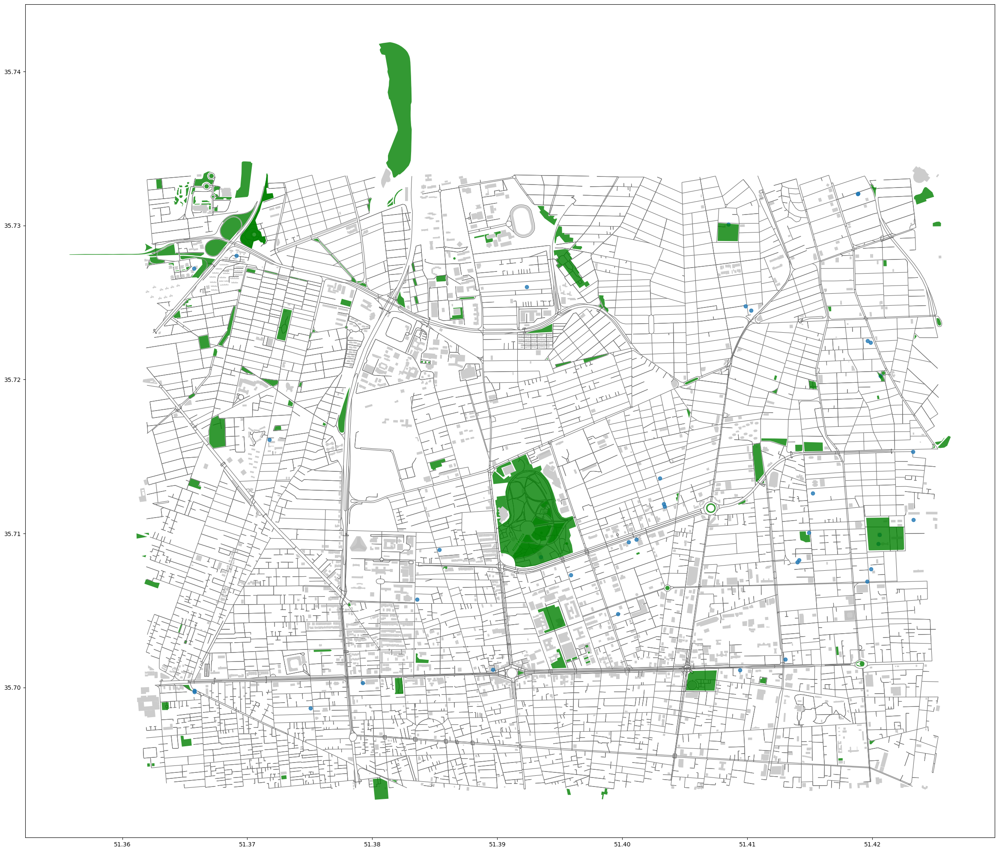

In [ ]:
ExportedJpegURL =  '/content/drive/My Drive/Exported_Jpeg/'

fig, ax = plt.subplots(figsize=(25,20))
# Plot the footprint
#area.plot(ax=ax, facecolor=’black’, zorder=0)
# Plot street edges
wgsedges.plot(ax=ax, linewidth=0.8, edgecolor='dimgray', zorder=1)
# Plot buildings
buildings.plot(ax=ax, facecolor='silver', alpha=0.8, zorder=2)
# Plot parks
parks.plot(ax=ax, color='green', alpha=0.8, markersize=12, zorder=3)
plt.tight_layout()
#plt.axis('off')
plt.savefig(ExportedJpegURL+ 'croped_net_and_Park_and_buildings.jpg')

Calculate travel distances to all parks

In [ ]:
import networkx as nx
parks["geometry"] = parks.centroid
parks = parks.sort_index()

# Get a list of nearest source-ids of the network to all hospitals (with distance)
# Warning: Using the nearest node (in stead of nearest edge) can produce slightly incorrect results,
# but for the sake of simplicity we use nodes.
i = 0
src_ids, euclidean_distances = [],[]
for _, row in parks.iterrows():
    i = i +1
    if((i/100).is_integer()):
      print(i)
    src_id, euclidean_distance = ox.nearest_nodes(cropped_graph, row.geometry.x, row.geometry.y,return_dist=True)
    src_ids.append(src_id)
    euclidean_distances.append(euclidean_distance)
    path_lengths = nx.single_source_dijkstra_path_length(G_con,src_id)
    # Add the euclidean distance between the hospital and closest node in the network
    # to keep track of the door-to-door travel distance
    path_lengths = {k: v + euclidean_distance for k, v in path_lengths.items()}
    newdf =  pd.DataFrame(path_lengths.items(), columns=['osmid', f"distance_to_{src_id}"])
    newdf.set_index('osmid',inplace = True)
    # Attach the path lenghts to nodes
    wgsnodes = pd.merge(wgsnodes,newdf[[f"distance_to_{src_id}"]],on='osmid', how='left')
   # wgsnodes[f"distance_to_{src_id}"] = path_lengths[0]
#src_ids, euclidean_distance = find_nearest_nodeids(wgsnodes, parks)

100


we calculate which of the parks is the closest one for each node

In [ ]:
src_cnt = len(src_ids)
# Calculate distance to the closest hospital
wgsnodes["distance_to_closest"] = wgsnodes.iloc[:, -src_cnt:].min(axis=1)

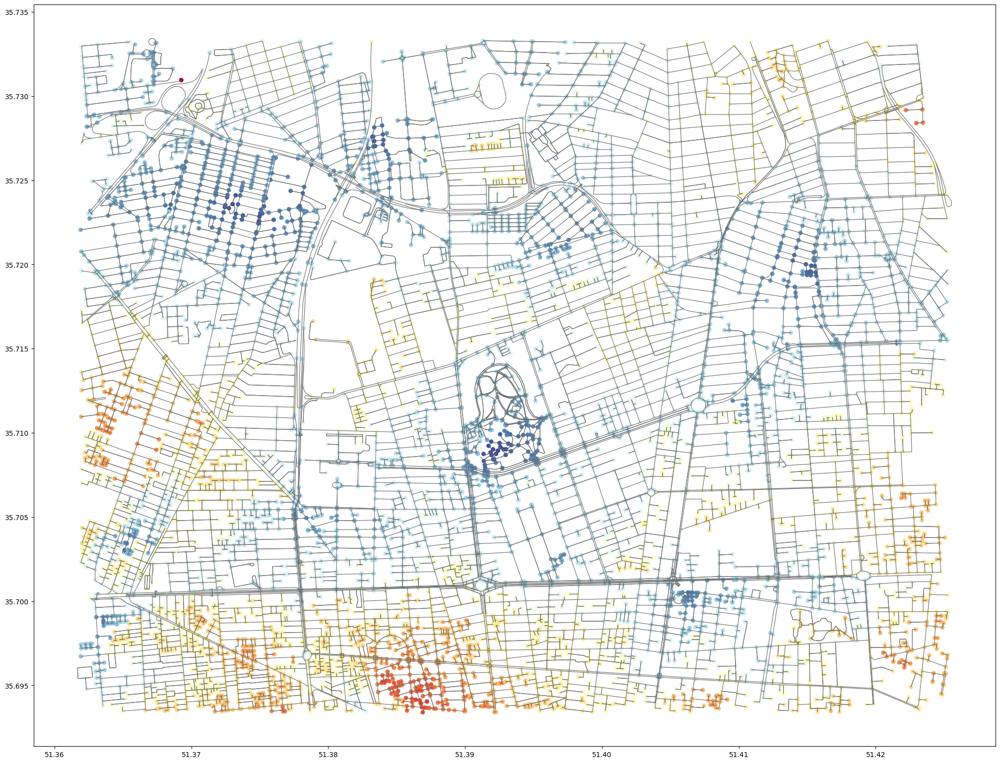

In [ ]:
ExportedJpegURL =  '/content/drive/My Drive/Exported_Jpeg/'
fig, ax = plt.subplots(figsize=(25,20))
#plt.style.use('bmh')

# At this point you could already see the catchment areas from each road network node
# to the closest parks.
# Comment out the following if you want to see:
wgsnodes.plot(ax = ax, column="distance_to_closest", cmap="RdYlBu_r", markersize=35)
parks.plot(ax=ax, color='green', alpha=0.5, markersize=12, zorder=1)
wgsedges.plot(ax=ax, linewidth=0.8, edgecolor='dimgray', zorder=2)

plt.savefig(ExportedJpegURL+ 'cropped_distance_to_closest_park_w.jpg')

Let’s find the closest node for each building and keep track of the distance between them

In [ ]:
# Find closest node for each building (centroid)
# Warning: Again, taking a centroid of a building might not be the smartest thing to do for real..
# But for the sake of simplicity, we do it such a way
buildings["geometry"] = buildings.centroid
buildings = buildings.sort_index()
Bsrc_ids, Beuclidean_distances = [],[]
i = 0
for _, row in buildings.iterrows():
    i = i + 1
    src_id, euclidean_distance = ox.nearest_nodes(cropped_graph, row.geometry.x, row.geometry.y,return_dist=True)
    if((i/100).is_integer()):
      print(i)
    Bsrc_ids.append(src_id)
    Beuclidean_distances.append(euclidean_distance)



100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100


In [ ]:
# Note: With ~900000 x ~830000 point pairs,
# this takes awhile to solve.
# Also keep track of the distance between the points.
buildings["node_id"] = Bsrc_ids
buildings["distance_to_closest_node"] = Beuclidean_distances

we can associate the distance information to closest parks into the buildings

In [ ]:
# Link the distance information
access = pd.merge(buildings.set_index('node_id', drop=True),wgsnodes[["distance_to_closest"]],left_on=['node_id'],right_on=['osmid'])
#access = buildings.set_index('node_id', drop=True).merge(wgsnodes[["distance_to_closest"]], on="osmid")

# Add the (Euclidean) distance between building
# and the closest node in the road network to get a full "door-to-door" distance
access["distance"] = access["distance_to_closest"] + access["distance_to_closest_node"]

# Calculate distance in kilometers (meters by default)
access["distance_km"] = (access["distance"] / 1000).round(1)

In [ ]:
access

,addr:street,atm,building,building:levels,name,operator,geometry,amenity,denomination,place_of_worship,...,service:vehicle:electrical,service:vehicle:electronic_injection,service:vehicle:repairs,distance_to_closest_node,osmid,distance_to_closest,distance,distance_km,cls,travel_distance
0,خیابان آزادی,yes,yes,4,انجمن خانه ناشنوایان ایران,بانک تجارت,POINT (51.37925 35.70030),NaN,NaN,NaN,...,NaN,NaN,NaN,18.728626,9318475093,26.906518,45.635144,0.0,5,50
1,خیابان آزادی,no,yes,NaN,مديريت تداركات و مهندسی بانک تجارت,NaN,POINT (51.37964 35.70036),bank,NaN,NaN,...,NaN,NaN,NaN,20.371863,9318475093,26.906518,47.278381,0.0,5,50
2,NaN,NaN,yes,NaN,مجتمع اداری تجاری پانامال,NaN,POINT (51.38000 35.70037),NaN,NaN,NaN,...,NaN,NaN,NaN,51.436777,9318475093,26.906518,78.343295,0.1,8,80
3,اسدآبادی,NaN,yes,NaN,فرهنگسرای شفق,NaN,POINT (51.40850 35.73008),community_centre,NaN,NaN,...,NaN,NaN,NaN,29.356319,9318475093,35.346954,64.703273,0.1,7,70
4,NaN,NaN,yes,NaN,کتابخانه دستغیب,NaN,POINT (51.40820 35.72999),library,NaN,NaN,...,NaN,NaN,NaN,10.396483,9318475093,35.346954,45.743437,0.0,5,50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,NaN,NaN,yes,NaN,NaN,NaN,POINT (51.39099 35.70015),NaN,NaN,NaN,...,NaN,NaN,NaN,17.039751,9318475093,33.906518,50.946269,0.1,6,60
2145,NaN,NaN,yes,NaN,NaN,NaN,POINT (51.39102 35.69982),NaN,NaN,NaN,...,NaN,NaN,NaN,19.432998,9318475093,33.906518,53.339516,0.1,6,60
2146,NaN,NaN,yes,NaN,NaN,NaN,POINT (51.39105 35.69959),NaN,NaN,NaN,...,NaN,NaN,NaN,39.622171,9318475093,30.893304,70.515475,0.1,8,80
2147,NaN,NaN,yes,NaN,NaN,NaN,POINT (51.39108 35.69942),NaN,NaN,NaN,...,NaN,NaN,NaN,22.919687,9318475093,30.893304,53.812991,0.1,6,60


Some of the buildings might be very far from the closest road. Drop buildings that are further than 10km from the road

In [ ]:
# Drop such buildings that are further than 5 km from closest road
access = access.loc[access["distance_to_closest_node"]<=5000]

Finally, to make things a bit more interesting, we can also classify the distances and calculate some statistics:

In [ ]:
import mapclassify as mc
# Classify distances to every 2 km zones, specify that the upper boundary is 50 kilometer
# everything above this will be put into a same class
upper_boundary_distance = 100
width = 10

# Use self-defined classification
classifier = mc.UserDefined(access["distance"], bins=[x for x in range(0, int(upper_boundary_distance)+1, width)])
access["cls"] = access[["distance"]].apply(classifier)
# Replace the class numbers to distance categories (e.g. 0-2, 2-4 .. km etc.)
access["travel_distance"] = access["cls"].replace({k: v
                                                   for k, v in
                                                   zip([x for x in range(len(classifier.bins))],
                                                       classifier.bins)})

# Set all values over 50 km as 51 (to improve how the colorscale works)
access.loc[access["travel_distance"] > upper_boundary_distance, "travel_distance"] = upper_boundary_distance + 1

# Convert the observation counts as percentages
classifier.counts = (classifier.counts / classifier.counts.sum()).round(3)

# Convert stats to dataframe
bins = classifier.bins.astype(int)
categories = np.vstack([bins[:-1], bins[1:]]).T
categories = [f"{low}-{high}" for low, high in categories]
access_zone_classes = pd.DataFrame({"Distance": categories, "% of buildings": classifier.counts[1:]})

 plot the results as a map

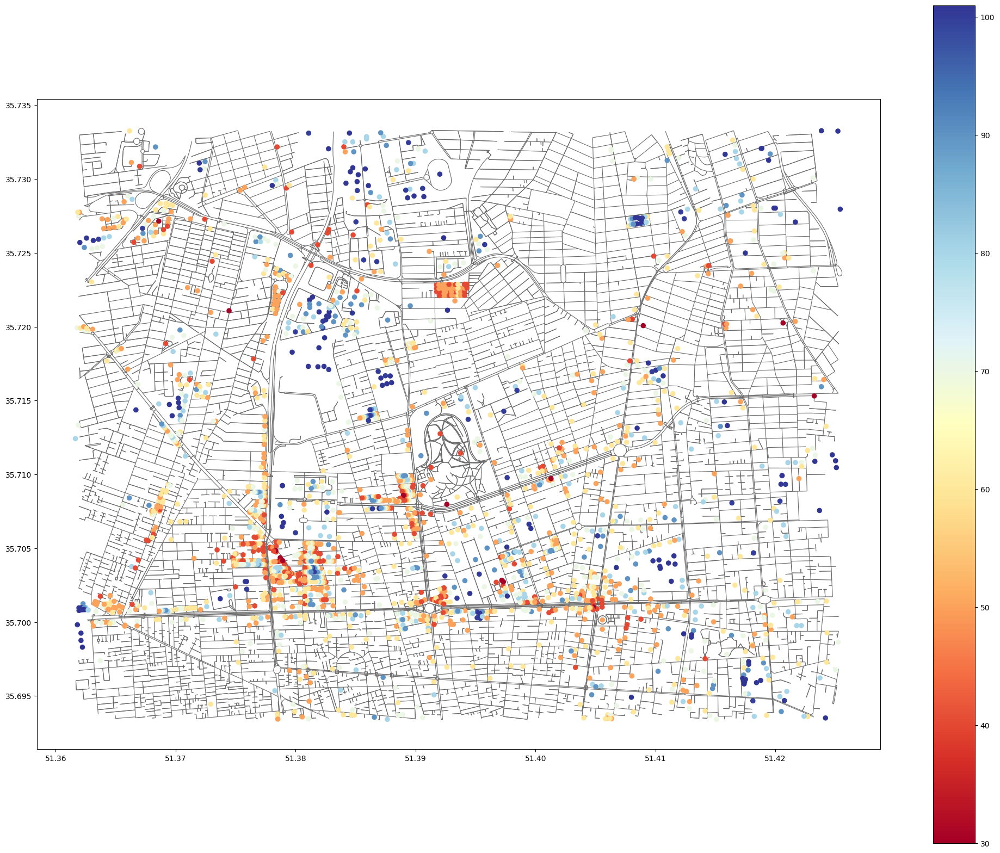

In [ ]:
# Track the number of buildings
ExportedJpegURL =  '/content/drive/My Drive/Exported_Jpeg/'
fig, ax = plt.subplots(figsize=(25,20))
building_cnt = len(buildings)
#plt.style.use('dark_background')
plt.style.use('default')

wgsedges.plot(ax=ax, linewidth=0.8, edgecolor='dimgray', zorder=1)
access.plot(ax=ax,column="travel_distance", markersize=35, legend=True, cmap="RdYlBu", figsize=(17,10))
plt.savefig(ExportedJpegURL+ 'Network distance (km) from buildings to closest park.jpg')

# Adjust the map extent
#ax.set_xlim(22.5, 30.5)
#ax.set_ylim(57.4, 59.9)
# Add some useful info
#ax.text(23, 59.8, f"Network distance (km) from {building_cnt} buildings to closest hospital (n={src_cnt}) in Estonia (mainland).", {"size": 14})
#ax.text(28.3, 58.0, access_zone_classes.to_string(index=False), {"size": 14});

## Calculate the parks accessibility

In [ ]:
# Assign a random number of workers for each restaurant (between 1-10)
restaurants["employee_cnt"] = np.random.choice([x for x in range(100,1100)], size=len(restaurants))
# Find the closest node-id for each restaurant
node_ids = G.get_node_ids(restaurants.lon, restaurants.lat)
# Add employee counts to the graph
G.set(node_ids, variable=restaurants.employee_cnt, name="employee_cnt")
# Calculate the number of employees (cumulative sum) from each node up to 500 meters
result = G.aggregate(500, type="sum", decay="linear", name="employee_cnt")
result = result.to_frame(name="cum_employees")
# Attach the information from nodes
result = wgsnodes.merge(result, left_on="id", right_on=result.index)
# Visualize the results
plt.style.use('dark_background')
ax = result.plot(column="cum_employees", cmap='BrBG', markersize=0.1, legend=True, figsize=(20, 20))

source:https://pyrosm.readthedocs.io/en/latest/graphs.html

In [ ]:
route = [7178799569,
 424074880,
 424074869,
 424074867,
 424074864,
 424074862,
 424074857,
 424074855,
 424074922,
 424074839,
 424074830,
 7072016317,
 7072016318,
 7072016319,
 7073930014,
 7072016320,
 7072016323,
 1649357090,
 7072016321,
 1649357095,
 1649357092,
 1649357097,
 10573211090,
 7072016339,
 7072016340,
 26366034,
 7072016335,
 7072016334,
 1649357154,
 27585289,
 1649357184,
 7072016328,
 7072016331,
 4754977026,
 4391394137,
 768559213,
 3953155573,
 4532784220,
 4532784206,
 806589528,
 4467482799,
 4433262166,
 4433262172,
 423811142,
 4297872626,
 2169893048,
 2169893046,
 4297872625,
 9672260176,
 9672264424,
 9672260190,
 9672260173,
 6913008377,
 6547553681,
 9672264437,
 9672264430,
 9672264433,
 9672264435,
 9672264432,
 6547556116,
 9887792214,
 9887792213,
 362831599,
 1653424517,
 1653424564,
 1653424548]
route

[7178799569,
 424074880,
 424074869,
 424074867,
 424074864,
 424074862,
 424074857,
 424074855,
 424074922,
 424074839,
 424074830,
 7072016317,
 7072016318,
 7072016319,
 7073930014,
 7072016320,
 7072016323,
 1649357090,
 7072016321,
 1649357095,
 1649357092,
 1649357097,
 10573211090,
 7072016339,
 7072016340,
 26366034,
 7072016335,
 7072016334,
 1649357154,
 27585289,
 1649357184,
 7072016328,
 7072016331,
 4754977026,
 4391394137,
 768559213,
 3953155573,
 4532784220,
 4532784206,
 806589528,
 4467482799,
 4433262166,
 4433262172,
 423811142,
 4297872626,
 2169893048,
 2169893046,
 4297872625,
 9672260176,
 9672264424,
 9672260190,
 9672260173,
 6913008377,
 6547553681,
 9672264437,
 9672264430,
 9672264433,
 9672264435,
 9672264432,
 6547556116,
 9887792214,
 9887792213,
 362831599,
 1653424517,
 1653424564,
 1653424548]

plot

save

In [ ]:
# Get the nodes along the shortest path
route_nodes = nodes.loc[route]
route_nodes

,y,x,street_count,lon,lat,highway,ref,geometry
osmid,,,,,,,,
7178799569,3.954504e+06,535360.584088,3,51.391029,35.733893,NaN,NaN,POINT (535360.584 3954504.401)
424074880,3.954530e+06,535346.716866,3,51.390876,35.734128,NaN,NaN,POINT (535346.717 3954530.388)
424074869,3.954587e+06,535332.409271,4,51.390721,35.734643,NaN,NaN,POINT (535332.409 3954587.495)
424074867,3.954620e+06,535333.156164,2,51.390730,35.734938,NaN,NaN,POINT (535333.156 3954620.206)
424074864,3.954661e+06,535340.898732,4,51.390818,35.735302,NaN,NaN,POINT (535340.899 3954660.631)
...,...,...,...,...,...,...,...,...
9887792213,3.956635e+06,534421.611862,3,51.380737,35.753133,NaN,NaN,POINT (534421.612 3956634.717)
362831599,3.956593e+06,534243.747659,3,51.378768,35.752763,NaN,NaN,POINT (534243.748 3956592.913)
1653424517,3.956582e+06,534065.627002,3,51.376797,35.752672,NaN,NaN,POINT (534065.627 3956582.134)


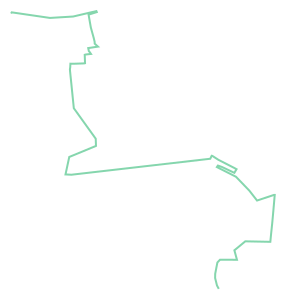

In [ ]:
import shapely.geometry

# Create a geometry for the shortest path
route_line = shapely.geometry.LineString(
    list(route_nodes.geometry.values)
)
route_line

In [ ]:
import geopandas

route_geom = geopandas.GeoDataFrame(
    {
        "geometry": [route_line],
        "osm_nodes": [route],
    },
    crs=edges.crs
)

# Calculate the route length
route_geom["length_m"] = route_geom.length

route_geom.head()

,geometry,osm_nodes,length_m
0,"LINESTRING (535360.584 3954504.401, 535346.717...","[7178799569, 424074880, 424074869, 424074867, ...",5610.199262


In [ ]:
UTMparks,UTMbuildings = parks.to_crs('epsg:32639'),buildings.to_crs('epsg:32639')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
G_con = ox.project_graph(graph, to_crs='epsg:32639')
UTMnodes, UTMedges = ox.graph_to_gdfs(G_con)
# Create a bounding box as a GeoDataFrame


TypeError: ignored

<Axes: >

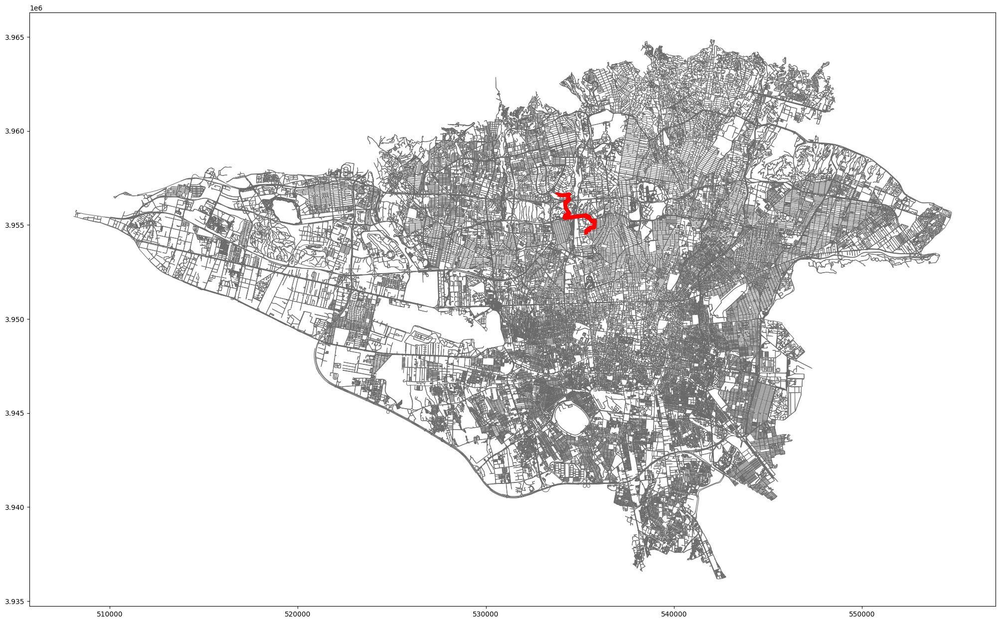

In [ ]:
# Plot the shortest path
#fig, ax = ox.plot_graph_route(graph, route ,route_color='r', route_linewidth=4, route_alpha=0.5, orig_dest_size=1000, ax=None,bbox = route_line.buffer(10000).bounds)
ExportedJpegURL =  '/content/drive/My Drive/Exported_Jpeg/'
fig, ax = plt.subplots(figsize=(25,20))
#building_cnt = len(buildings)
#plt.style.use('dark_background')
plt.style.use('default')

UTMedges.plot(ax=ax, linewidth=0.8, edgecolor='dimgray', zorder=1)
route_geom.plot(ax=ax,linewidth=5.8, edgecolor='r', zorder=2)

In [ ]:
west, south, east, north = route_line.buffer(1000).bounds[0],route_line.buffer(1000).bounds[1],route_line.buffer(1000).bounds[2],route_line.buffer(1000).bounds[3]
Cropbbox = gpd.GeoDataFrame(geometry=[box(west, south, east, north)], crs='EPSG:32639')
#cropped_graph = ox.truncate.truncate_graph_bbox(G_con, north, south, east, west)

# Crop the GeoDataFrame based on the bounding box
UTMparksC = UTMparks.cx[west:east, south:north]
UTMbuildingsC = UTMbuildings.cx[west:east, south:north]
UTMnodesC, UTMedgesC = UTMnodes.cx[west:east, south:north],UTMedges.cx[west:east, south:north]

<Axes: >

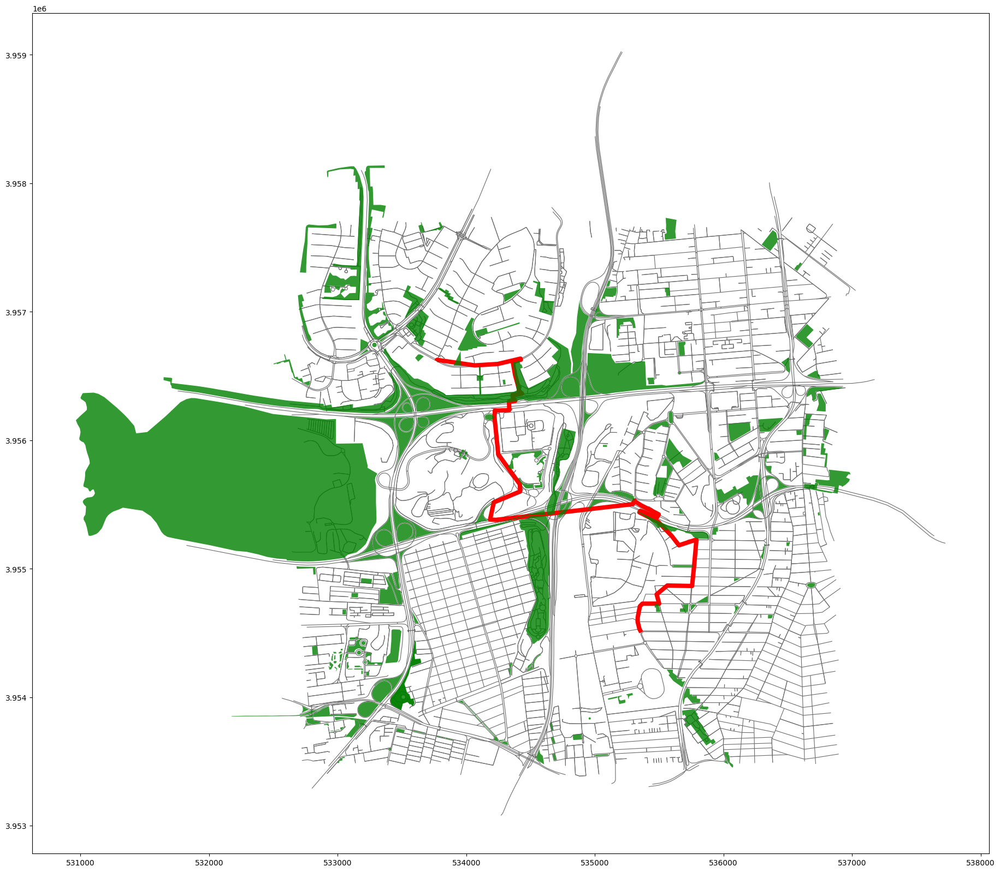

In [ ]:
# Plot the shortest path
#fig, ax = ox.plot_graph_route(graph, route ,route_color='r', route_linewidth=4, route_alpha=0.5, orig_dest_size=1000, ax=None,bbox = route_line.buffer(10000).bounds)
ExportedJpegURL =  '/content/drive/My Drive/Exported_Jpeg/'
fig, ax = plt.subplots(figsize=(25,20))
#building_cnt = len(buildings)
#plt.style.use('dark_background')
plt.style.use('default')

UTMedgesC.plot(ax=ax, linewidth=0.8, edgecolor='dimgray', zorder=1)
route_geom.plot(ax=ax,linewidth=5.8, edgecolor='r',zorder=1 )
UTMparksC.plot(ax=ax, color='green', alpha=0.8, markersize=12, zorder=3)


<Axes: >

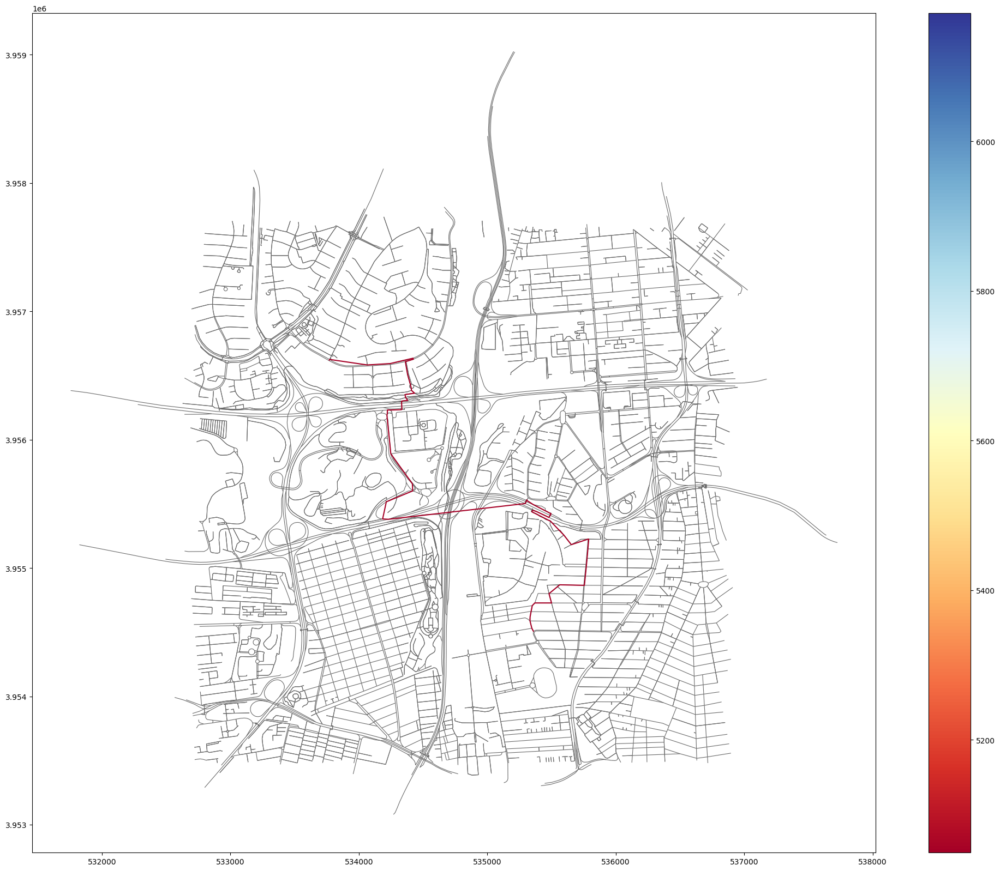

In [ ]:
# Plot the shortest path
#fig, ax = ox.plot_graph_route(graph, route ,route_color='r', route_linewidth=4, route_alpha=0.5, orig_dest_size=1000, ax=None,bbox = route_line.buffer(10000).bounds)
ExportedJpegURL =  '/content/drive/My Drive/Exported_Jpeg/'
fig, ax = plt.subplots(figsize=(25,20))
#building_cnt = len(buildings)
#plt.style.use('dark_background')
plt.style.use('default')

UTMedgesC.plot(ax=ax, linewidth=0.8, edgecolor='dimgray', zorder=1)
route_geom.plot(ax=ax,column="length_m", markersize=35, legend=True, cmap="RdYlBu", figsize=(17,10))
#UTMparksC.plot(ax=ax, color='green', alpha=0.8, markersize=12, zorder=3)

In [ ]:
fig, ax = ox.plot_graph(cropped_graph)



In [ ]:
route_geom

,geometry,osm_nodes,length_m
0,"LINESTRING (535360.584 3954504.401, 535346.717...","[7178799569, 424074880, 424074869, 424074867, ...",5610.199262


In [ ]:
route_geom =

In [ ]:
import geopandas
predict = pd.DataFrame( route_geom.length,columns = ["length_m"])
route_geom2 = geopandas.GeoDataFrame(
  geometry= [route_line],
    crs=edges.crs
)


# Calculate the route length
route_geom2["length_m"] = route_geom2.length

route_geom2.head()
# Calculate the route length
#route_geom2["length_m"] = route_geom.length

route_geom2.head()

,geometry,length_m
0,"LINESTRING (535360.584 3954504.401, 535346.717...",5610.199262


In [ ]:
ShapefilesURL='/content/drive/My Drive/ShapeFiles/'
route_geom2.to_file(ShapefilesURL + "without weight.shp", driver='ESRI Shapefile')

In [ ]:
newRoute = [7178799569,
 4591377575,
 1649357065,
 1649357063,
 1649357061,
 7730921967,
 7730931393,
 424074816,
 424074817,
 7730921964,
 7072015803,
 10653563673,
 25940101,
 25922580,
 8613135608,
 9216536674,
 1880160147,
 1649103779,
 1649104003,
 26364048,
 4754992132,
 26364031,
 26364029,
 7072016331,
 4754977026,
 26364264,
 5163833746,
 190980537,
 190980724,
 31207498,
 6465642865,
 6465743030,
 31073565,
 4755357125,
 1681485262,
 6588907494,
 7714218685,
 5507343483,
 270877066,
 9672264494,
 1653424691,
 1653424548]
newRoute

[7178799569,
 4591377575,
 1649357065,
 1649357063,
 1649357061,
 7730921967,
 7730931393,
 424074816,
 424074817,
 7730921964,
 7072015803,
 10653563673,
 25940101,
 25922580,
 8613135608,
 9216536674,
 1880160147,
 1649103779,
 1649104003,
 26364048,
 4754992132,
 26364031,
 26364029,
 7072016331,
 4754977026,
 26364264,
 5163833746,
 190980537,
 190980724,
 31207498,
 6465642865,
 6465743030,
 31073565,
 4755357125,
 1681485262,
 6588907494,
 7714218685,
 5507343483,
 270877066,
 9672264494,
 1653424691,
 1653424548]

In [ ]:
# Get the nodes along the shortest path
newRoute_nodes = nodes.loc[newRoute]
newRoute_nodes

,y,x,street_count,lon,lat,highway,ref,geometry
osmid,,,,,,,,
7178799569,3.954504e+06,535360.584088,3,51.391029,35.733893,NaN,NaN,POINT (535360.584 3954504.401)
4591377575,3.954428e+06,535381.135177,3,51.391253,35.733206,NaN,NaN,POINT (535381.135 3954428.309)
1649357065,3.954427e+06,535380.182802,3,51.391242,35.733192,NaN,NaN,POINT (535380.183 3954426.752)
1649357063,3.954415e+06,535381.729692,3,51.391258,35.733089,NaN,NaN,POINT (535381.730 3954415.290)
1649357061,3.954411e+06,535392.526547,3,51.391378,35.733049,NaN,NaN,POINT (535392.527 3954410.952)
7730921967,3.954290e+06,535480.114987,3,51.392341,35.731955,NaN,NaN,POINT (535480.115 3954289.964)
7730931393,3.954295e+06,535486.886002,4,51.392416,35.732001,NaN,NaN,POINT (535486.886 3954295.104)
424074816,3.954294e+06,535605.477790,4,51.393727,35.731983,NaN,NaN,POINT (535605.478 3954293.594)
424074817,3.954292e+06,535679.303995,4,51.394544,35.731969,NaN,NaN,POINT (535679.304 3954292.315)


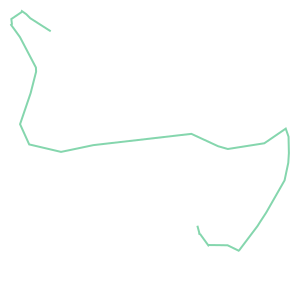

In [ ]:
import shapely.geometry

# Create a geometry for the shortest path
newRoute_line = shapely.geometry.LineString(
    list(newRoute_nodes.geometry.values)
)
newRoute_line

In [ ]:
import geopandas

newRoute_geom = geopandas.GeoDataFrame(
    {
        "geometry": [newRoute_line],
        "osm_nodes": [newRoute],
    },
    crs=edges.crs
)

# Calculate the route length
newRoute_geom["length_m"] = newRoute_geom.length

newRoute_geom.head()

,geometry,osm_nodes,length_m
0,"LINESTRING (535360.584 3954504.401, 535381.135...","[7178799569, 4591377575, 1649357065, 164935706...",7008.308432


<Axes: >

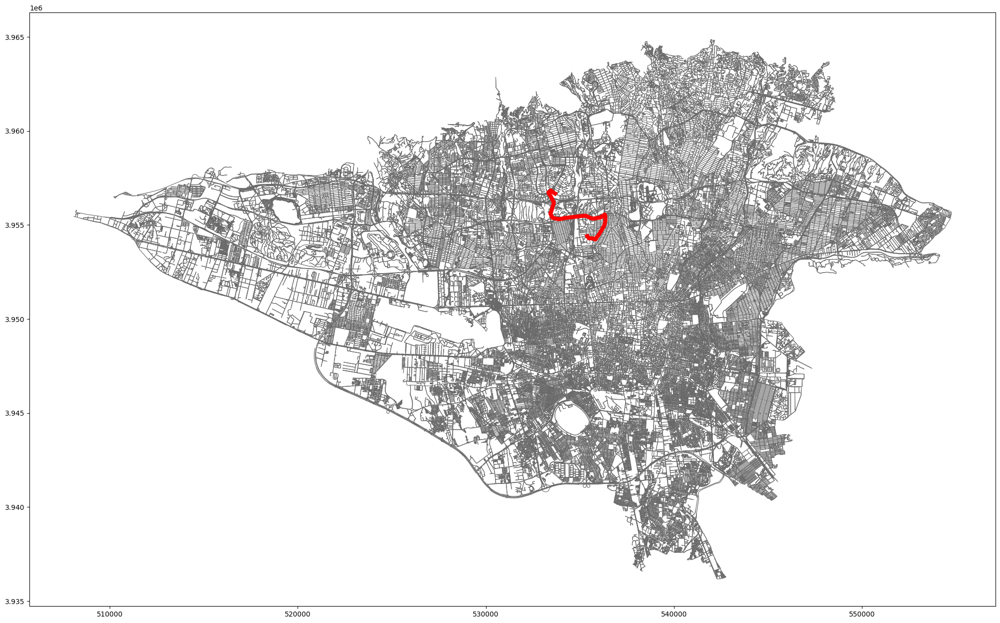

In [ ]:
# Plot the shortest path
#fig, ax = ox.plot_graph_route(graph, route ,route_color='r', route_linewidth=4, route_alpha=0.5, orig_dest_size=1000, ax=None,bbox = route_line.buffer(10000).bounds)
ExportedJpegURL =  '/content/drive/My Drive/Exported_Jpeg/'
fig, ax = plt.subplots(figsize=(25,20))
#building_cnt = len(buildings)
#plt.style.use('dark_background')
plt.style.use('default')

UTMedges.plot(ax=ax, linewidth=0.8, edgecolor='dimgray', zorder=1)
newRoute_geom.plot(ax=ax,linewidth=5.8, edgecolor='r', zorder=2)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<Axes: >

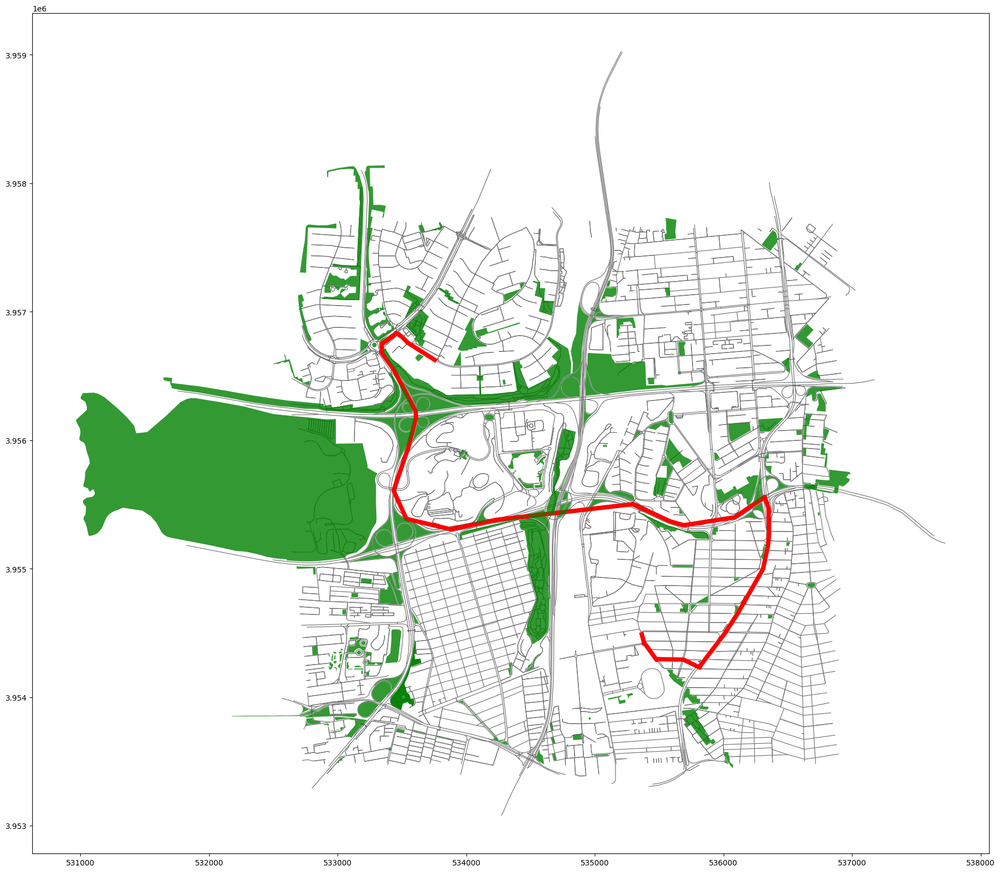

In [ ]:
# Plot the shortest path
#fig, ax = ox.plot_graph_route(graph, route ,route_color='r', route_linewidth=4, route_alpha=0.5, orig_dest_size=1000, ax=None,bbox = route_line.buffer(10000).bounds)
ExportedJpegURL =  '/content/drive/My Drive/Exported_Jpeg/'
fig, ax = plt.subplots(figsize=(25,20))
#building_cnt = len(buildings)
#plt.style.use('dark_background')
plt.style.use('default')

UTMedgesC.plot(ax=ax, linewidth=0.8, edgecolor='dimgray', zorder=1)
newRoute_geom.plot(ax=ax,linewidth=5.8, edgecolor='r',zorder=1 )
UTMparksC.plot(ax=ax, color='green', alpha=0.8, markersize=12, zorder=3)


In [ ]:
import geopandas
route_geom2 = geopandas.GeoDataFrame(
  geometry= [newRoute_line],
    crs=edges.crs
)

# Calculate the route length
route_geom2["length_m"] = route_geom2.length

route_geom2.head()
# Calculate the route length
#route_geom2["length_m"] = route_geom.length


,geometry,length_m
0,"LINESTRING (535360.584 3954504.401, 535381.135...",7008.308432


In [ ]:
ShapefilesURL='/content/drive/My Drive/ShapeFiles/'
route_geom2.to_file(ShapefilesURL + "with weight.shp", driver='ESRI Shapefile')

<Axes: >

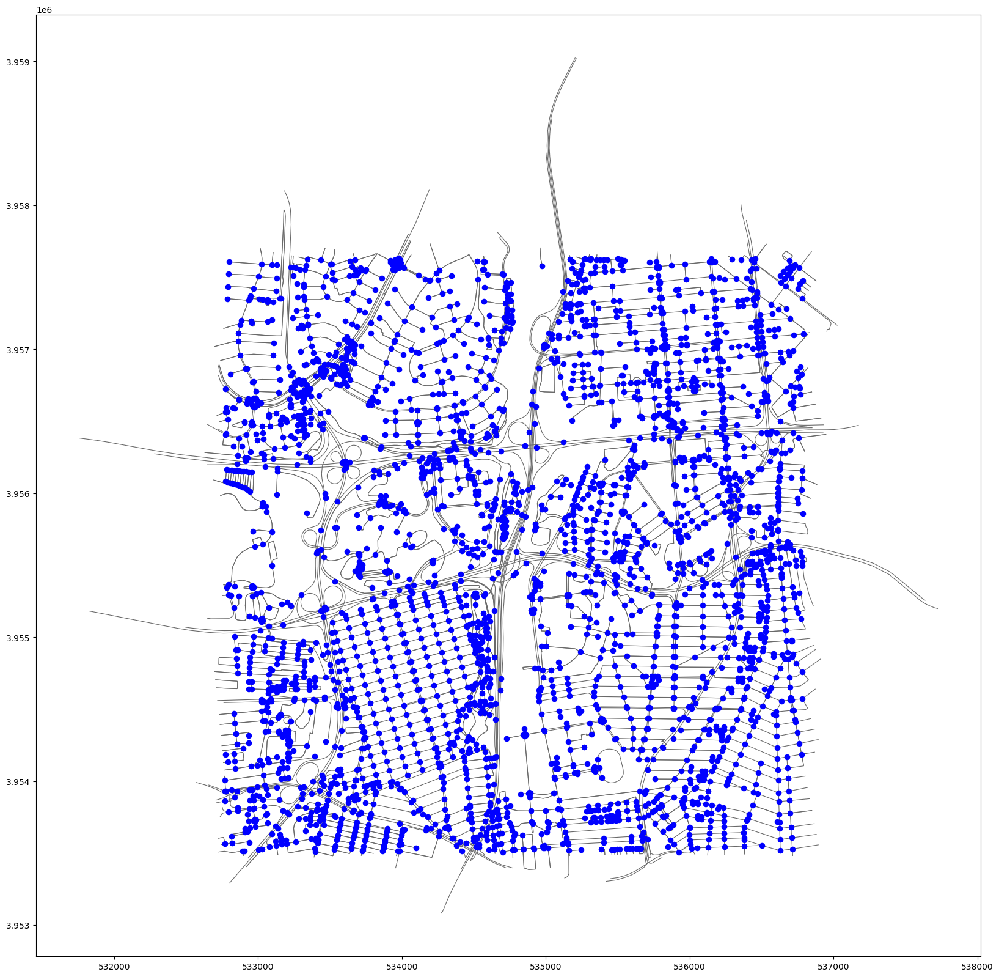

In [ ]:
ExportedJpegURL =  '/content/drive/My Drive/Exported_Jpeg/'
fig, ax = plt.subplots(figsize=(25,20))
#building_cnt = len(buildings)
#plt.style.use('dark_background')
plt.style.use('default')

UTMedgesC.plot(ax=ax, linewidth=0.8, edgecolor='dimgray', zorder=1)
UTMnodesC.plot(ax=ax,  markersize=35, color='b', zorder=1)


In [ ]:
parks.loc[("way", 453943973):]

UnsortedIndexError: ignored

In [ ]:
parks.loc[['way',453943973]].head()

KeyError: ignored

In [ ]:
alltype  = pd.DataFrame({'element_type':buildings.index.get_level_values("element_type")}).groupby('element_type')
alltype.groups.keys()

dict_keys(['node', 'relation', 'way'])

In [ ]:
newbuliding = buildings
newbuliding = newbuliding.xs('node', level=0, axis=0, drop_level=False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
newbuliding['osmid'] = newbuliding.index.get_level_values("osmid")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
from pyrosm import OSM, get_data
import geopandas as gpd
import pandas as pd
from sklearn.neighbors import BallTree
import numpy as np
import mapclassify as mc
import matplotlib.pyplot as plt
import time

def get_igraph_nodes(G):
    """Retrieves a frame from nodes of the igaph"""
    attributes = G.vs.attribute_names()
    if len(attributes) == 0:
        raise ValueError("Nodes does not have data.")
    data = {name: G.vs[name] for name in attributes}
    if "geometry" in attributes:
        return gpd.GeoDataFrame(data,
                                geometry="geometry",
                                crs="epsg:4326")
    return pd.DataFrame(data)

def get_nearest(src_points, candidates, k_neighbors=1):
    """Find nearest neighbors for all source points from a set of candidate points"""
    tree = BallTree(candidates, leaf_size=15, metric='haversine')
    distances, indices = tree.query(src_points, k=k_neighbors)
    distances = distances.transpose()
    indices = indices.transpose()
    closest = indices[0]
    closest_dist = distances[0]
    return (closest, closest_dist)

def nearest_neighbor(left_gdf, right_gdf, return_dist=False):
    """
    For each point in left_gdf, find closest point in right GeoDataFrame and return them.

    For further info, take a look this lesson:
        https://autogis-site.readthedocs.io/en/latest/notebooks/L3/06_nearest-neighbor-faster.html
    """
    left_geom_col = left_gdf.geometry.name
    right_geom_col = right_gdf.geometry.name
    right = right_gdf.copy().reset_index(drop=True)
    left_radians = np.array(left_gdf[left_geom_col].apply(lambda geom:
                                                          (geom.x * np.pi / 180, geom.y * np.pi / 180)
                                                         ).to_list())
    right_radians = np.array(right[right_geom_col].apply(lambda geom:
                                                         (geom.x * np.pi / 180, geom.y * np.pi / 180)
                                                        ).to_list())
    closest, dist = get_nearest(src_points=left_radians, candidates=right_radians)
    closest_points = right.loc[closest]
    closest_points = closest_points.reset_index(drop=False)
    if return_dist:
        earth_radius = 6371000  # meters
        closest_points['distance'] = dist * earth_radius
    return closest_points

def find_nearest_nodeids(nodes, src_gdf):
    """Finds the nearest node-ids for all points in 'src_gdf'."""
    nearest = nearest_neighbor(src_gdf, nodes, return_dist=True)
    return list(set(nearest["index"].values)), nearest["distance"].values